## Refine Mesenchymal cell annotations - relabelling uncertain cells based on manual inspection/majority voting

In [1]:
import scanpy as sc
import pandas as pd
import numpy as np
import sys
import os
from collections import Counter

import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.colors import to_hex
import ast

In [2]:
sc.logging.print_header()

scanpy==1.8.0 anndata==0.8.0 umap==0.4.6 numpy==1.20.1 scipy==1.6.1 pandas==1.3.5 scikit-learn==0.24.1 statsmodels==0.13.5 python-igraph==0.8.3 louvain==0.7.0 leidenalg==0.8.3 pynndescent==0.5.2


In [3]:
plt.rcParams['pdf.fonttype'] = 42
plt.rcParams['ps.fonttype'] = 42

In [4]:
sc.set_figure_params(
    dpi=200,dpi_save=300,
    fontsize=12,
    frameon=False,
    transparent=True,
)

In [5]:
sns.set_style(style="white")
sns.set_context(context="paper")

### Import

In [8]:
#import data
adata = sc.read_h5ad('/nfs/team205/ao15/Megagut/Annotations_v3/h5ad/disease/compartments/Mesenchyme_pooled_disease.gene_cellbender.good_qc_cluster_mito80.stringent_doublet_removed.hvg7500_noCC.scvi_output.lv20_batch256.with_raw_counts.scArches_broad_pred.20230124.h5ad')

In [9]:
adata

AnnData object with n_obs × n_vars = 18903 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

In [11]:
#import scanvi coordinates
adata_scanvi = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/X_scANVI/disease/disease_fine_annot_predict_Mes_20230226.csv.gz',compression='gzip',index_col=0)

In [12]:
adata_scanvi

,LV1,LV2,LV3,LV4,LV5,LV6,LV7,LV8,LV9,LV10,LV11,LV12,LV13,LV14,LV15,LV16,LV17,LV18,LV19,LV20
index,,,,,,,,,,,,,,,,,,,,
AAAGCAACACCATCCT-4918STDY7273964,-0.057625,-0.042171,-0.285732,-0.001239,-0.019258,0.336607,-0.339518,0.408953,0.071482,-0.243724,-0.177286,-0.468702,0.509646,0.002497,-0.112188,0.003067,-0.097492,0.042197,0.558173,0.403839
AAATGCCAGACCTAGG-4918STDY7273964,0.059836,-0.099243,1.511871,-0.068022,0.118960,-1.031133,-0.278688,0.207325,-4.254483,0.013175,-0.745814,0.882726,-0.138928,-0.108574,-0.003928,-0.067769,0.231224,0.086978,1.503616,0.063275
AAATGCCGTCTAGAGG-4918STDY7273964,0.019607,-0.035252,-0.405572,0.124444,0.110700,-0.479515,1.004145,-0.879032,1.795589,1.557218,-0.408852,0.420887,-0.921947,0.123123,0.102065,-0.091211,-0.912088,-0.028405,0.413698,0.474730
AACCATGGTGGTCTCG-4918STDY7273964,0.008183,-0.024308,0.072217,-0.009606,0.085716,-0.429228,-0.302057,-0.427956,-2.482032,0.327178,-0.643279,-1.052222,0.314086,-0.072258,-0.014911,-0.008163,-0.408055,0.233192,1.897344,-0.006456
AACCGCGGTGATAAGT-4918STDY7273964,-0.028659,0.043448,-1.189826,0.087071,-0.060540,0.809780,0.395918,-1.361331,0.599943,0.239911,0.636280,-0.759169,0.130200,0.013647,0.074249,0.008936,-0.593475,0.119989,0.288523,0.904192
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCGTTACCAGT-GSM4546346,-0.040045,0.001779,-1.773015,-0.104590,-0.120331,-0.124013,1.264487,0.927511,-0.361215,-0.976406,1.606136,1.453451,0.026392,0.005958,-0.033165,0.077868,1.617085,0.046102,1.465235,1.222183
TTTGCGCCACAACGCC-GSM4546346,0.127734,0.044807,0.661179,-0.003204,0.068617,0.153232,-0.654127,-0.294501,-1.518063,0.609824,1.401071,0.116217,-1.616143,0.037230,-0.046146,0.005901,-0.068254,0.107801,-0.813862,-1.231151
TTTGCGCGTCTCATCC-GSM4546346,0.011015,0.034218,-1.095899,-0.081064,-0.038080,0.292692,-0.475019,-0.650030,-0.994066,0.164745,0.913382,1.198472,0.742885,-0.027088,-0.028627,0.090453,1.829028,0.202077,1.324024,0.390079


In [13]:
adata.obsm['X_scANVI'] = adata_scanvi

In [14]:
#import metadata
adata_meta = pd.read_csv('/nfs/team205/ao15/Megagut/Annotations_v3/metadata/disease/20230308/scanvi/disease_fine_annot_predict_Mes_20230226.csv',index_col=0)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3437: DtypeWarning: Columns (84,100) have mixed types.Specify dtype option on import or set low_memory=False.
  exec(code_obj, self.user_global_ns, self.user_ns)


In [15]:
adata_meta

,latent_cell_probability,latent_RT_efficiency,cecilia22_predH,cecilia22_predH_prob,cecilia22_predH_uncertain,cecilia22_predL,cecilia22_predL_prob,cecilia22_predL_uncertain,elmentaite21_pred,elmentaite21_pred_prob,...,martin19_pred_uncertain,warner20_pred,warner20_pred_prob,warner20_pred_uncertain,broad_predicted_labels,broad_predicted_labels_uncert,fine_annot,fine_predicted_labels,fine_predicted_labels_uncertainty,scanvi_pred
index,,,,,,,,,,,,,,,,,,,,,
AAAGCAACACCATCCT-4918STDY7273964,0.999041,0.731684,Fibroblasts,0.118177,Uncertain,Fibroblasts,0.304166,Fibroblasts,SELL+ CD4 T,0.413993,...,Uncertain,Th,0.199945,Uncertain,Mesenchymal,0.000000e+00,Unknown,Lamina_propria_fibroblast_ADAMDEC1,0.220001,Lamina_propria_fibroblast_ADAMDEC1
AAATGCCAGACCTAGG-4918STDY7273964,0.999939,2.868829,T cells,0.918127,T cells,Endothelial cells,0.712799,Endothelial cells,Contractile pericyte (PLN+),1.000000,...,SM,SM,0.993256,SM,Mesenchymal,0.000000e+00,Unknown,Vascular_smooth_muscle,0.220019,Vascular_smooth_muscle
AAATGCCGTCTAGAGG-4918STDY7273964,0.999971,3.864576,Fibroblasts,0.986204,Fibroblasts,Fibroblasts,0.929843,Fibroblasts,Stromal 4 (MMP1+),0.999999,...,S5,Fibroblasts,0.591832,Fibroblasts,Mesenchymal,5.960464e-08,Unknown,Oral_mucosa_fibroblast,0.020016,Oral_mucosa_fibroblast
AACCATGGTGGTCTCG-4918STDY7273964,0.999627,1.257938,T cells,0.073594,Uncertain,Endothelial cells,0.054005,Uncertain,Contractile pericyte (PLN+),0.999953,...,SM,SM,0.881191,SM,Mesenchymal,5.960464e-08,Unknown,Vascular_smooth_muscle,0.019998,Vascular_smooth_muscle
AACCGCGGTGATAAGT-4918STDY7273964,0.999938,2.723624,Fibroblasts,0.999965,Fibroblasts,Fibroblasts,0.999881,Fibroblasts,Stromal 4 (MMP1+),0.999869,...,S5,Fibroblasts,0.554809,Fibroblasts,Mesenchymal,0.000000e+00,Unknown,Lamina_propria_fibroblast_ADAMDEC1,0.099978,Fibroblast_reticular
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTCCTCGTTACCAGT-GSM4546346,0.999864,1.901295,ILC,0.000069,Uncertain,NK cells,0.001013,Uncertain,Pericyte,0.999316,...,Pericyte,PC,0.409853,PC,Mesenchymal,0.000000e+00,Unknown,Doublets,0.019960,Doublets
TTTGCGCCACAACGCC-GSM4546346,0.999514,1.127976,ILC,0.004255,Uncertain,Fibroblasts,0.001279,Uncertain,Stromal 2 (NPY+),0.448895,...,S2,Fibroblasts,0.627080,Fibroblasts,Mesenchymal,5.960464e-08,Unknown,Villus_fibroblast_F3,0.080033,Villus_fibroblast_F3
TTTGCGCGTCTCATCC-GSM4546346,0.999834,1.352647,T cells,0.091294,Uncertain,NK cells,0.001211,Uncertain,Pericyte,0.999986,...,Pericyte,PC,0.713692,PC,Mesenchymal,0.000000e+00,Unknown,Pericyte,0.000000,Pericyte


In [16]:
adata.obs = adata_meta

### Process

In [17]:
#compute neighbours and umap
sc.pp.neighbors(adata, use_rep="X_scANVI")
sc.tl.umap(adata)

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


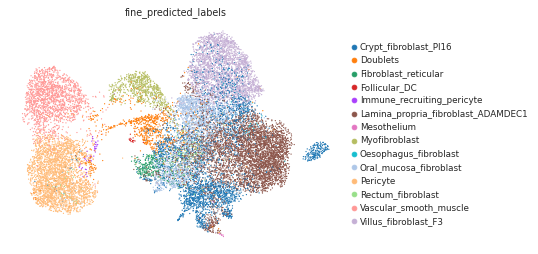

In [18]:
sc.pl.umap(adata, color=['fine_predicted_labels'])

In [19]:
adata.obs.donor_disease.unique()

['PIBD', 'cancer', 'UC', 'CD']
Categories (4, object): ['CD', 'PIBD', 'UC', 'cancer']

In [20]:
#fix metadata
adata.obs['disease'] = adata.obs['donor_category'].astype(str) + '_' + adata.obs['donor_disease'].astype(str)

In [21]:
list(adata.obs.disease.unique())

['disease_PIBD', 'disease_cancer', 'disease_UC', 'disease_CD']

In [22]:
adata.obs.disease.value_counts()

disease_cancer    8473
disease_UC        5647
disease_PIBD      3590
disease_CD        1193
Name: disease, dtype: int64

In [23]:
adata.obs.donor_disease.unique()

['PIBD', 'cancer', 'UC', 'CD']
Categories (4, object): ['CD', 'PIBD', 'UC', 'cancer']

In [24]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{
'disease_cancer':'cancer',
    'disease_PIBD':'pediatric_IBD',
    'disease_UC':'ulcertaive_colitis',
    'disease_CD':'crohns_disease'
    }.get(x,x)).astype("category"))

In [25]:
cancer = adata[adata.obs['disease'].isin(['cancer'])].copy()

In [26]:
cancer.obs.disease.value_counts()

cancer    8473
Name: disease, dtype: int64

In [27]:
cancer.obs['disease'] = cancer.obs['disease'].astype(str) + '_' + cancer.obs['organ_unified'].astype(str)

In [28]:
cancer.obs.disease.value_counts()

cancer_stomach            4624
cancer_sigmoid colon      1460
cancer_colon               968
cancer_rectum              567
cancer_caecum              547
cancer_ascending colon     307
Name: disease, dtype: int64

In [29]:
cancer.obs['disease'] = (cancer.obs['disease'].map(lambda x:{'cancer_caecum':'cancer_colorectal',
 'cancer_rectum':'cancer_colorectal',
 'cancer_sigmoid colon':'cancer_colorectal',
 'cancer_colon':'cancer_colorectal',
 'cancer_ascending colon':'cancer_colorectal',
 'cancer_stomach':'cancer_gastric'}.get(x,x)).astype("category"))

In [30]:
cancer.obs.disease.value_counts()

cancer_gastric       4624
cancer_colorectal    3849
Name: disease, dtype: int64

In [31]:
ON = {O:N for O,N in zip(cancer.obs_names,cancer.obs["disease"])}
adata.obs["disease"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["disease"])]
adata.obs.disease.value_counts()

ulcertaive_colitis    5647
cancer_gastric        4624
cancer_colorectal     3849
pediatric_IBD         3590
crohns_disease        1193
Name: disease, dtype: int64

In [32]:
list(adata.obs.disease.unique())

['pediatric_IBD',
 'cancer_colorectal',
 'ulcertaive_colitis',
 'crohns_disease',
 'cancer_gastric']

In [33]:
adata.obs['disease'] = adata.obs['disease'].astype('category')

In [34]:
adata.obs['disease'] = (adata.obs['disease'].map(lambda x:{'ulcertaive_colitis':'ulcerative_colitis'}.get(x,x)).astype("category"))

In [35]:
adata.obs['disease'].cat.reorder_categories([
 'crohns_disease',
 'ulcerative_colitis',
 'pediatric_IBD',
 'cancer_colorectal',
 'cancer_gastric'], inplace=True)

<ipython-input-35-b0e974b68020>:1: FutureWarning: The `inplace` parameter in pandas.Categorical.reorder_categories is deprecated and will be removed in a future version. Reordering categories will always return a new Categorical object.
  adata.obs['disease'].cat.reorder_categories([


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


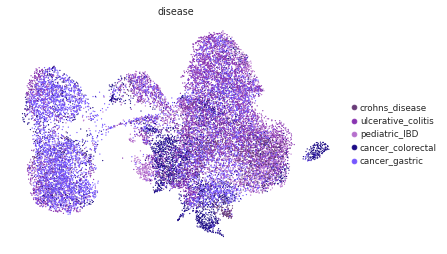

In [36]:
#plot umaps
sc.pl.umap(adata,color = 'disease',palette=[#'#ADD3DD',#control
                                    #'#ffb7b7',#'inutero',
                                     #'#f48154',#'preterm',
                                    '#693C78',#crohn's disease
                                            '#8934B1',#UC
                                            '#B670CD',#PIBD
                                            '#1C0B86',#colorectal cancer
                                            '#7657ff',#gastric cancer
                                           ])

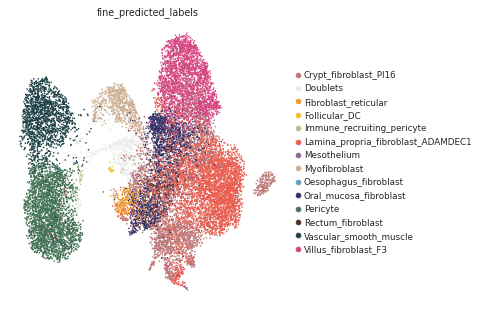

In [43]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels',palette = ['#bd7879',#'Crypt_fibroblast_PI16', 
                                                          '#ebeded',#doublets
           '#f0982c',#'Follicular_DC', 
                                                          '#f0c134',#'Stromal_fibroblast_reticular',
           '#AAC789',#'Immune_recruiting_pericyte',
           '#e95e50',#'Lamina_propria_fibroblast_ADAMDEC1', 
           '#8F6592',#'Mesothelium', 
           '#CCAE91',#'Myofibroblast',
           '#63A0C0',#'Oesophagus_fibroblast', 
           '#303267',#'Oral_mucosa_fibroblast', 
           '#437356',#'Pericyte',
           '#522e25',#'Rectum_fibroblast',
           
           '#1E4147',#'Vascular_smooth_muscle',
           '#d64582'#'Villus_fibroblast_F3'
                                                         ]
           ,size=10)

In [39]:
adata.X.max()

12104.0

In [40]:
adata.layers['counts'] = adata.X

In [41]:
sc.pp.normalize_total(adata, target_sum=1e4)
sc.pp.log1p(adata)

In [42]:
marker_genes_dict = {'General fibroblast markers':['VCAN', 'PDGFRA'],
                     'General smooth muscle/pericyte markers':['TAGLN', 'ACTA2','TPM2', 'MYH11'],
                     'Crypt_fibroblast_PI16':['PI16','RSPO3','SFRP1','ITM2A'],
                     'Follicular_DC':['FDCSP','SRGN','CR2','CLU','CSTA'],
                     'Immune_recruiting_pericyte':['GPC3','COL14A1','ECRG4','ID4','FHL2','CXCL12'],
                     'Lamina_propria_fibroblast_ADAMDEC1':['ADAMDEC1','CXCL14','ADAM28','CCL11','CCL8','CCL13','CFD'],
                     'Mesothelium':['UPK3B','MSLN','SLPI','KRT19'],
                     'Myofibroblast':['ACTG2','HHIP','SOSTDC1','NPNT'],
                     'Oesophagus_fibroblast':['APOD','PLPP1','MFAP4','IFITM1','RASD1'],
                     'Oral_mucosa_fibroblast':['CTHRC1','COL12A1','COL1A1','CTSK','COL5A2'],
                     'Pericyte':['CD36','COX4I2','HIGD1B','RGS5','NDUFA4L2'],
                     'Rectum_fibroblast':['KCNN3','THBS4','FNDC1','PPFIBP1'],
                     'Stromal_fibroblast_retictular':['CCL21','CCL19','TNFSF13B','TDO2'],
                     'Vascular_smooth_muscle':['RERGL','MUSTN1','LBH','NET1','MAP3K20'],
                     'Villus_fibroblast_F3':['F3','PLAT','HSD17B2','SOX6']}

In [44]:
adata

AnnData object with n_obs × n_vars = 18903 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


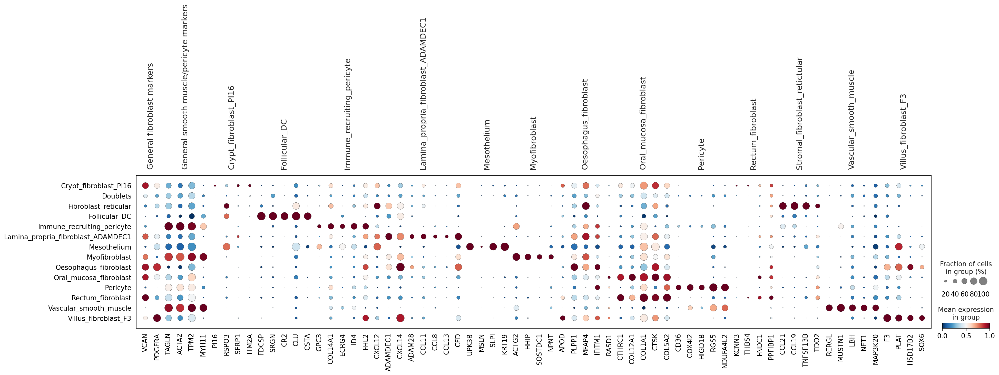

In [45]:
#plot markers
sc.set_figure_params(dpi_save = 300)
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='fine_predicted_labels',color_map='RdBu_r', standard_scale='var')

### Define uncertain cells

In [46]:
uncert = adata.obs[['fine_predicted_labels','fine_predicted_labels_uncertainty']] 

In [47]:
#calculate 90th percentile to use as cut off for uncertain cells
p = np.percentile(adata.obs['fine_predicted_labels_uncertainty'], 90) # return 90th percentile
print(p)

0.5000855147838592


(array([6087., 1127.,  832., 1269.,  501.,  518.,  864.,  351.,  413.,
         692.,  378.,  333.,  356.,  690.,  356.,  349.,  771.,  356.,
         419.,  656.,  325.,  271.,  217.,  375.,  135.,  102.,  115.,
          20.,   15.,   10.]),
 array([0.        , 0.02600438, 0.05200876, 0.07801313, 0.10401751,
        0.13002189, 0.15602627, 0.18203065, 0.20803502, 0.2340394 ,
        0.26004378, 0.28604816, 0.31205254, 0.33805691, 0.36406129,
        0.39006567, 0.41607005, 0.44207443, 0.4680788 , 0.49408318,
        0.52008756, 0.54609194, 0.57209632, 0.59810069, 0.62410507,
        0.65010945, 0.67611383, 0.70211821, 0.72812258, 0.75412696,
        0.78013134]),
 <BarContainer object of 30 artists>)

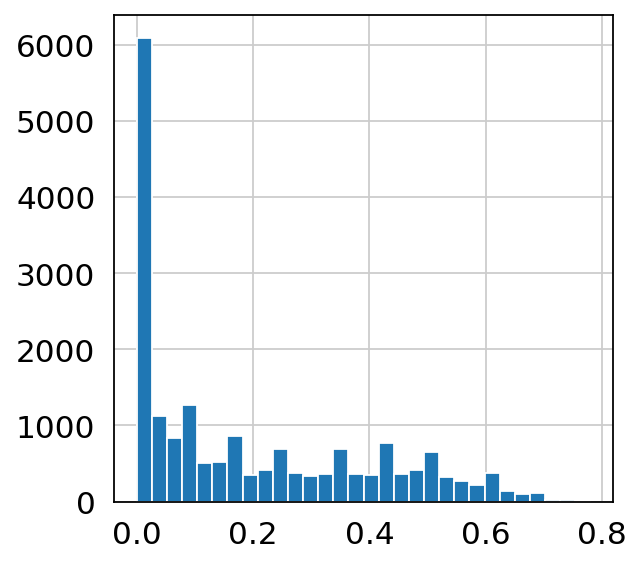

In [48]:
#plot uncertainty distribution
plt.hist(adata.obs['fine_predicted_labels_uncertainty'], bins=30)

In [49]:
uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')

<ipython-input-49-905f2ed234d6>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  uncert['fine_predicted_labels'] = uncert['fine_predicted_labels'].cat.add_categories('Unknown')


In [50]:
adata.obs['fine_predicted_labels'].unique()

['Lamina_propria_fibroblast_ADAMDEC1', 'Vascular_smooth_muscle', 'Oral_mucosa_fibroblast', 'Fibroblast_reticular', 'Pericyte', ..., 'Follicular_DC', 'Rectum_fibroblast', 'Oesophagus_fibroblast', 'Immune_recruiting_pericyte', 'Mesothelium']
Length: 14
Categories (14, object): ['Crypt_fibroblast_PI16', 'Doublets', 'Fibroblast_reticular', 'Follicular_DC', ..., 'Pericyte', 'Rectum_fibroblast', 'Vascular_smooth_muscle', 'Villus_fibroblast_F3']

In [51]:
#mark cells are unknown based on cut off of 90th percentile
uncert.loc[uncert["fine_predicted_labels_uncertainty"] > p, "fine_predicted_labels"] = "Unknown"

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/pandas/core/indexing.py:1817: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  self._setitem_single_column(loc, value, pi)


In [52]:
adata.obs['fine_predicted_labels_uncertflagged'] = adata.obs['fine_predicted_labels']

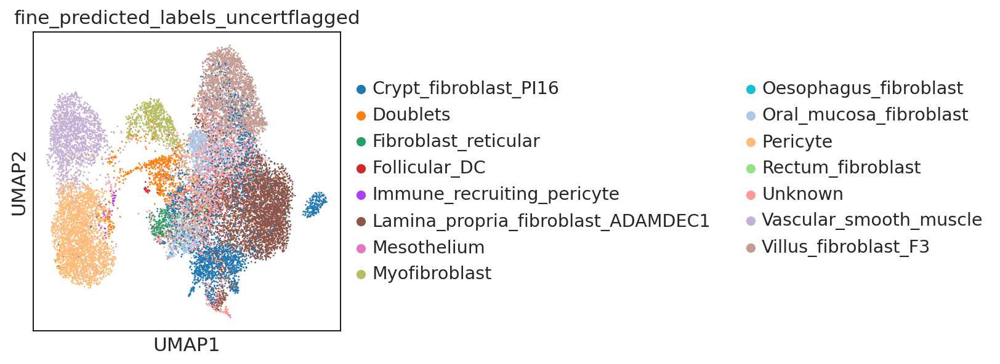

In [53]:
ON = {O:N for O,N in zip(uncert.index,uncert["fine_predicted_labels"])}
adata.obs["fine_predicted_labels_uncertflagged"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged')

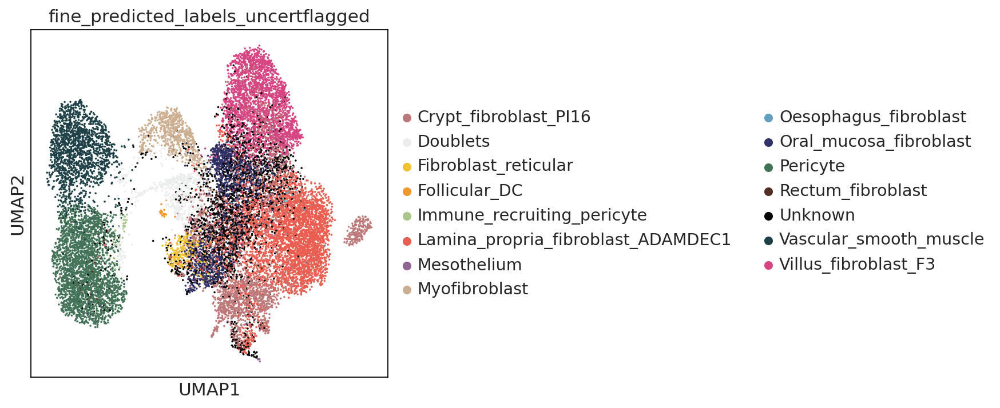

In [55]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_uncertflagged',palette = ['#bd7879',#'Crypt_fibroblast_PI16', 
                                                          '#ebeded',#doublets
           '#f0c134',#'Stromal_fibroblast_reticular',
                                                                        '#f0982c',#'Follicular_DC', 
                                                          
           '#AAC789',#'Immune_recruiting_pericyte',
           '#e95e50',#'Lamina_propria_fibroblast_ADAMDEC1', 
           '#8F6592',#'Mesothelium', 
           '#CCAE91',#'Myofibroblast',
           '#63A0C0',#'Oesophagus_fibroblast', 
           '#303267',#'Oral_mucosa_fibroblast', 
           '#437356',#'Pericyte',
           '#522e25',#'Rectum_fibroblast',
           '#000000',#unknown
           '#1E4147',#'Vascular_smooth_muscle',
           '#d64582'#'Villus_fibroblast_F3'

                                                                       ],size=10)

### Finalise annotations
- calculate leiden clusters
- inspect annotations across leiden clusters
- assess marker genes, doublet markers, donor distribution
- relabel based on majority voting of leiden clusters, along with confirmation from marker genes etc.

In [56]:
#reassign labels for unknown cells by leiden clustering and majority voting
sc.tl.leiden(adata,resolution=1,key_added='leiden1')

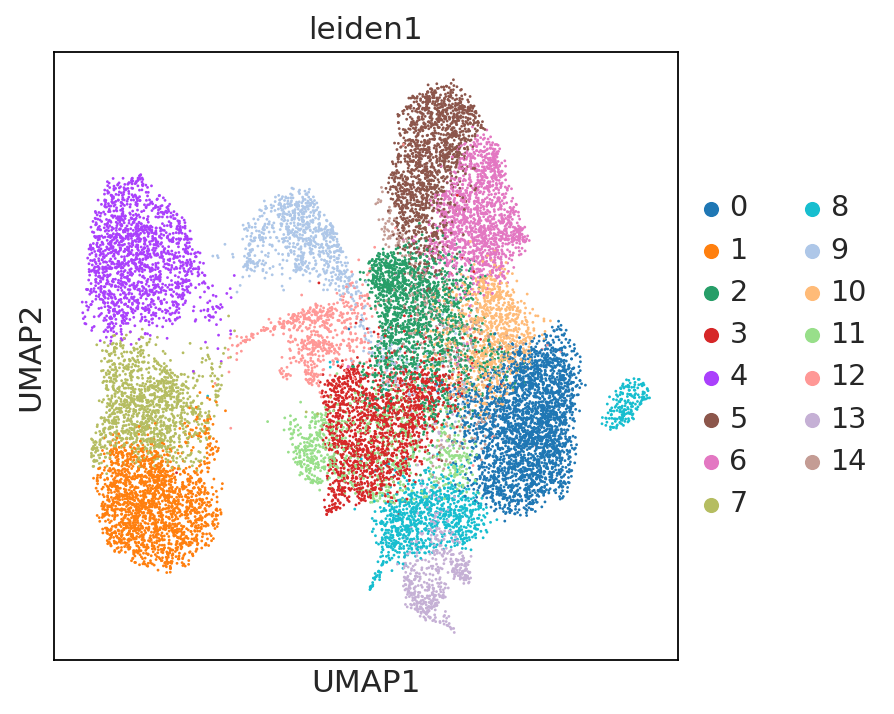

In [57]:
sc.pl.umap(adata,color='leiden1')

In [58]:
#quick look at leiden resolution 0.5
sc.tl.leiden(adata,resolution=0.5,key_added='leiden0.5')

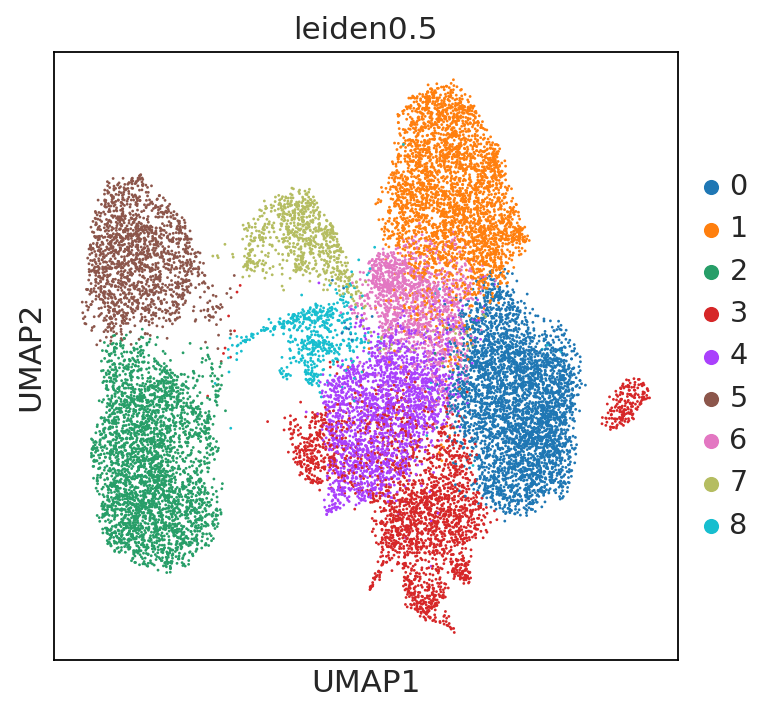

In [59]:
sc.pl.umap(adata,color='leiden0.5')

In [63]:
pd.crosstab(adata.obs.fine_predicted_labels_uncertflagged,adata.obs.leiden1)

leiden1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
fine_predicted_labels_uncertflagged,,,,,,,,,,,,,,,
Crypt_fibroblast_PI16,89,3,127,364,0,86,198,5,975,1,190,77,41,208,27
Doublets,2,78,21,48,38,2,5,3,2,37,0,5,444,3,4
Fibroblast_reticular,0,0,0,0,0,0,0,0,0,0,0,249,0,0,0
Follicular_DC,0,0,2,0,0,0,0,0,0,0,0,0,20,0,0
Immune_recruiting_pericyte,0,3,0,0,0,0,0,35,0,1,0,0,0,0,0
Lamina_propria_fibroblast_ADAMDEC1,2541,1,282,122,0,9,6,1,75,56,423,372,18,165,184
Mesothelium,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0
Myofibroblast,2,0,0,24,0,0,0,0,0,703,0,0,0,0,0
Oesophagus_fibroblast,3,0,4,0,0,0,2,0,0,0,8,0,0,0,0


In [62]:
pd.crosstab(adata.obs.fine_predicted_labels_uncertflagged,adata.obs['leiden0.5'])

leiden0.5,0,1,2,3,4,5,6,7,8
fine_predicted_labels_uncertflagged,,,,,,,,,
Crypt_fibroblast_PI16,234,348,7,1253,439,0,76,0,34
Doublets,4,11,81,10,57,38,22,35,434
Fibroblast_reticular,0,0,0,249,0,0,0,0,0
Follicular_DC,0,0,0,0,0,0,0,0,22
Immune_recruiting_pericyte,0,0,38,0,0,0,0,1,0
Lamina_propria_fibroblast_ADAMDEC1,3155,90,2,638,183,0,165,14,8
Mesothelium,0,0,0,5,0,0,0,0,0
Myofibroblast,4,2,0,0,39,0,0,684,0
Oesophagus_fibroblast,15,2,0,0,0,0,0,0,0


In [64]:
#Use Leiden resolution 1
unknown = adata.obs[['leiden1','fine_predicted_labels_uncertflagged']]

In [65]:
unknown = unknown[unknown['fine_predicted_labels_uncertflagged'].isin(['Unknown'])]

In [66]:
unknown

,leiden1,fine_predicted_labels_uncertflagged
index,,
ACGCCGAAGAGCTGGT-4918STDY7273964,11,Unknown
ATGCGATAGGTGATAT-4918STDY7273964,2,Unknown
CCGTTCATCGGAAATA-4918STDY7273964,2,Unknown
CTCTACGTCAGTTTGG-4918STDY7273964,1,Unknown
GAAACTCCATATGAGA-4918STDY7273964,11,Unknown
...,...,...
ATCCACCGTTTGTGTG-GSM4546342,14,Unknown
GCTCCTAGTCTTCAAG-GSM4546342,6,Unknown
CACATAGCAATCTGCA-GSM4546346,5,Unknown


/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


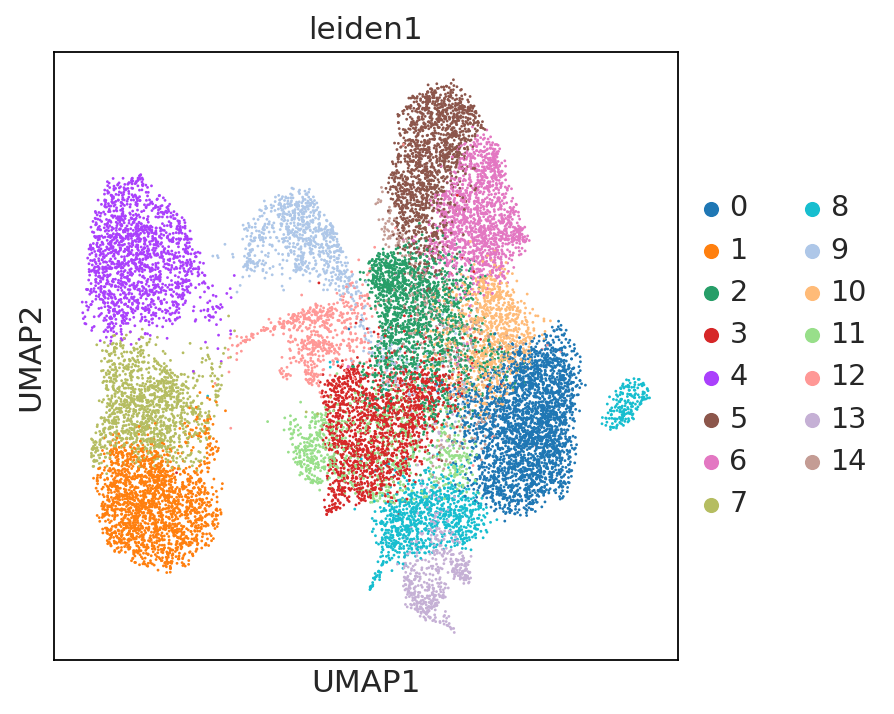

In [67]:
sc.pl.umap(adata,color='leiden1')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


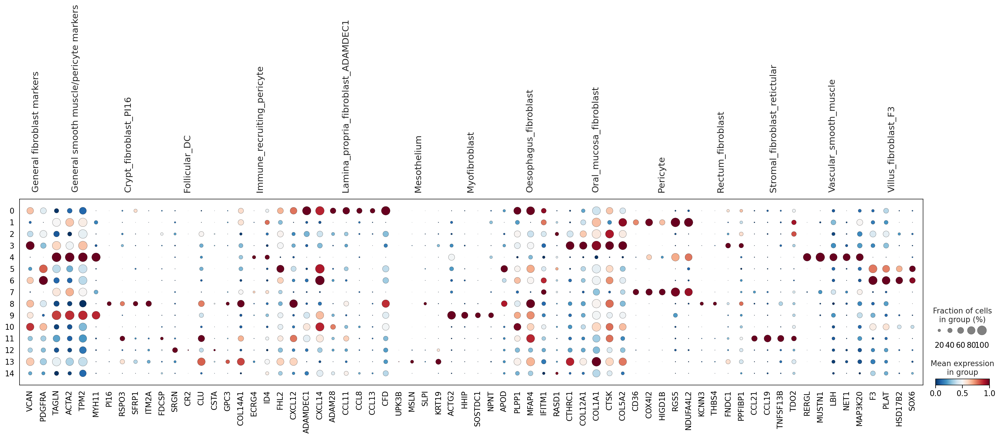

In [68]:
sc.pl.dotplot(adata,var_names=marker_genes_dict,groupby='leiden1',color_map='RdBu_r', standard_scale='var')

In [69]:
pd.crosstab(adata.obs.fine_predicted_labels_uncertflagged,adata.obs.leiden1)

leiden1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
fine_predicted_labels_uncertflagged,,,,,,,,,,,,,,,
Crypt_fibroblast_PI16,89,3,127,364,0,86,198,5,975,1,190,77,41,208,27
Doublets,2,78,21,48,38,2,5,3,2,37,0,5,444,3,4
Fibroblast_reticular,0,0,0,0,0,0,0,0,0,0,0,249,0,0,0
Follicular_DC,0,0,2,0,0,0,0,0,0,0,0,0,20,0,0
Immune_recruiting_pericyte,0,3,0,0,0,0,0,35,0,1,0,0,0,0,0
Lamina_propria_fibroblast_ADAMDEC1,2541,1,282,122,0,9,6,1,75,56,423,372,18,165,184
Mesothelium,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0
Myofibroblast,2,0,0,24,0,0,0,0,0,703,0,0,0,0,0
Oesophagus_fibroblast,3,0,4,0,0,0,2,0,0,0,8,0,0,0,0


In [70]:
unknown_adata = adata[adata.obs['fine_predicted_labels_uncertflagged'].isin(['Unknown'])].copy()

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_dotplot.py:749: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  dot_ax.scatter(x, y, **kwds)


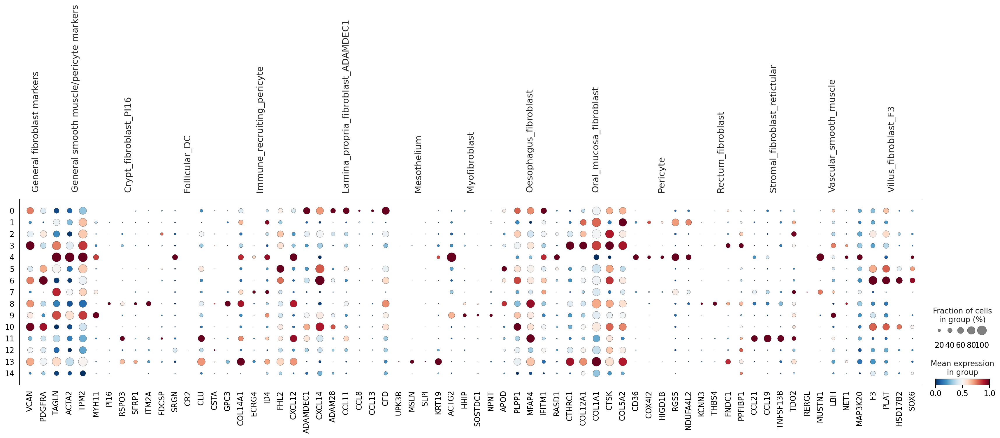

In [71]:
sc.pl.dotplot(unknown_adata,var_names=marker_genes_dict,groupby='leiden1',color_map='RdBu_r', standard_scale='var')

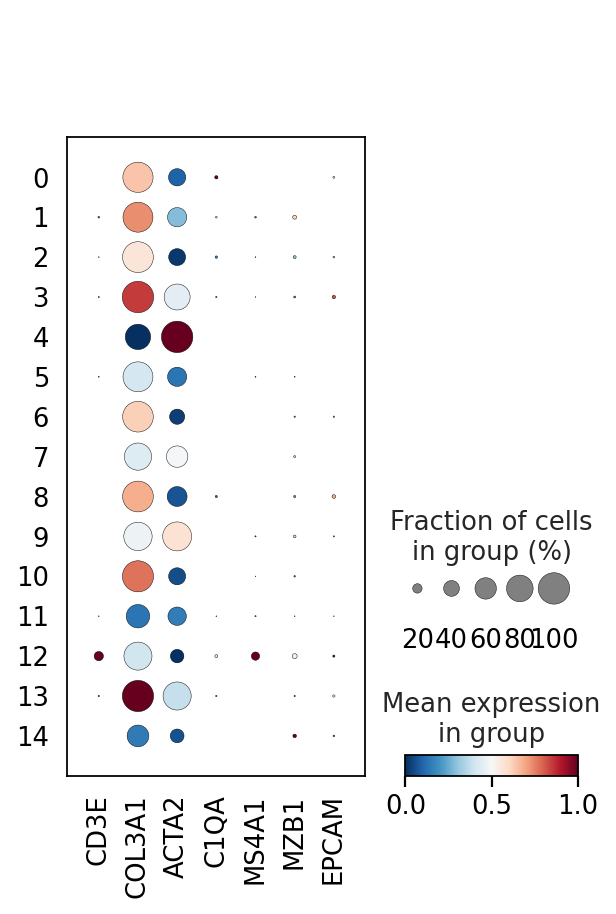

In [72]:
#plot some doublet markers
sc.pl.dotplot(unknown_adata,var_names=['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','EPCAM'],groupby='leiden1',color_map='RdBu_r', standard_scale='var')

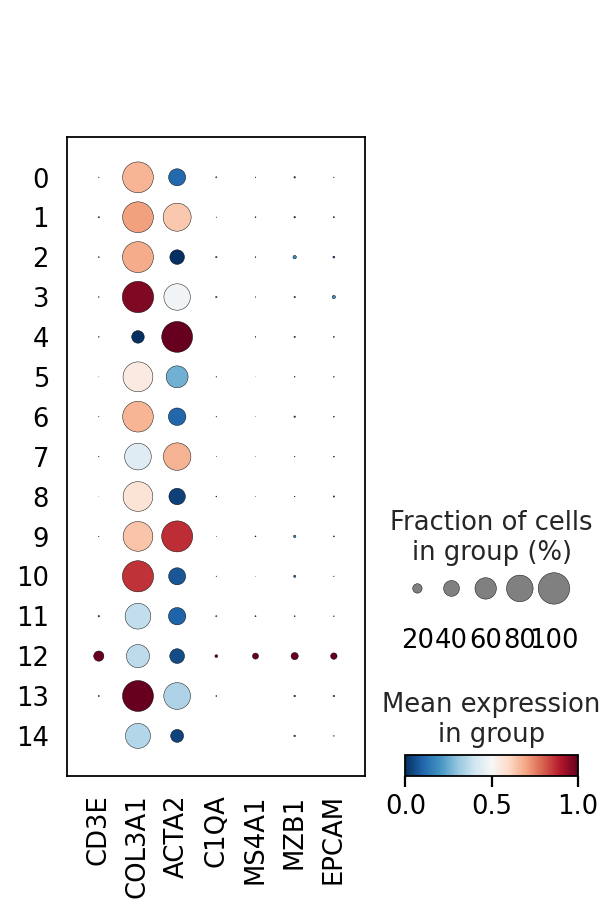

In [73]:
#plot some doublet markers
sc.pl.dotplot(adata,var_names=['CD3E','COL3A1','ACTA2','C1QA','MS4A1','MZB1','EPCAM'],groupby='leiden1',color_map='RdBu_r', standard_scale='var')

/home/jovyan/my-conda-envs/standard_plotting/lib/python3.8/site-packages/scanpy/plotting/_tools/scatterplots.py:378: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  cax = scatter(


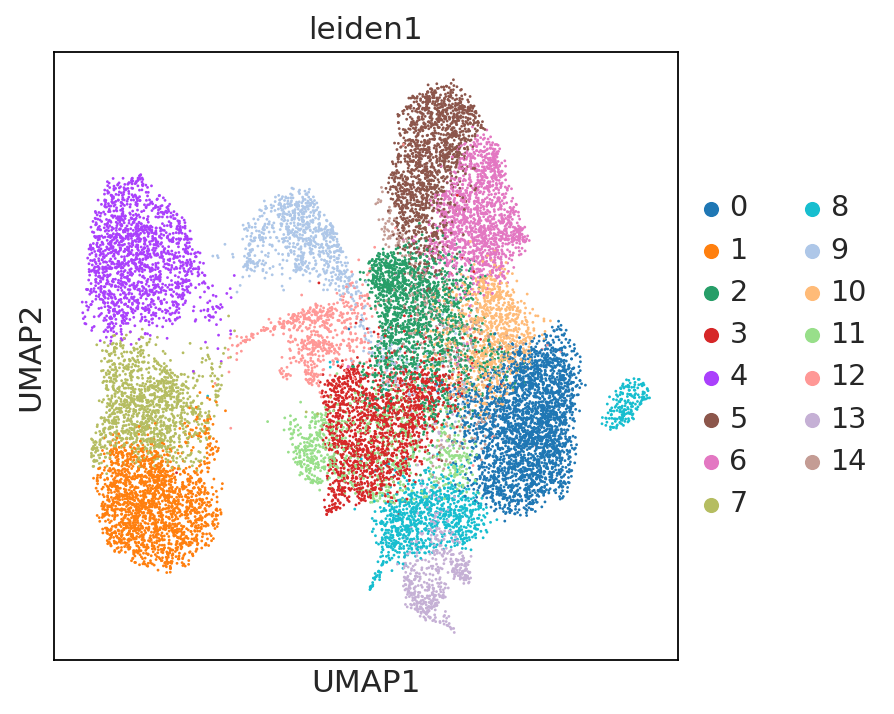

In [74]:
sc.pl.umap(adata,color='leiden1')

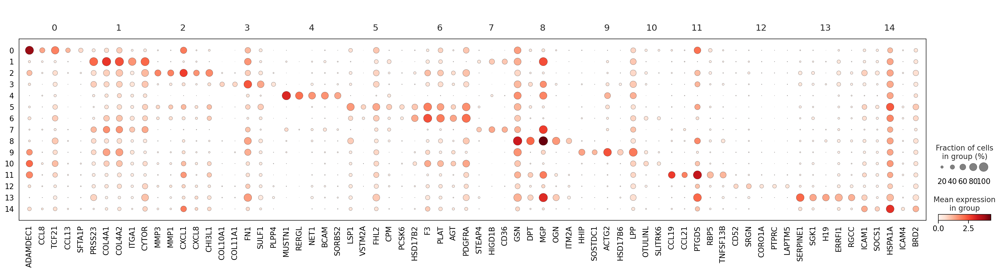

In [75]:
import sys
sys.path.append("/home/jovyan/ao15/Megagut/")
from re5_combine import *
adata.raw = adata.copy()
mkst = calc_marker_stats(adata, groupby="leiden1")
mks = filter_marker_stats(mkst[2], min_frac_diff=0.1, min_mean_diff=0.1, max_next_frac=0.5, max_next_mean=0.95, strict=False, how='or')
plot_markers(adata, groupby='leiden1', mks=mks)

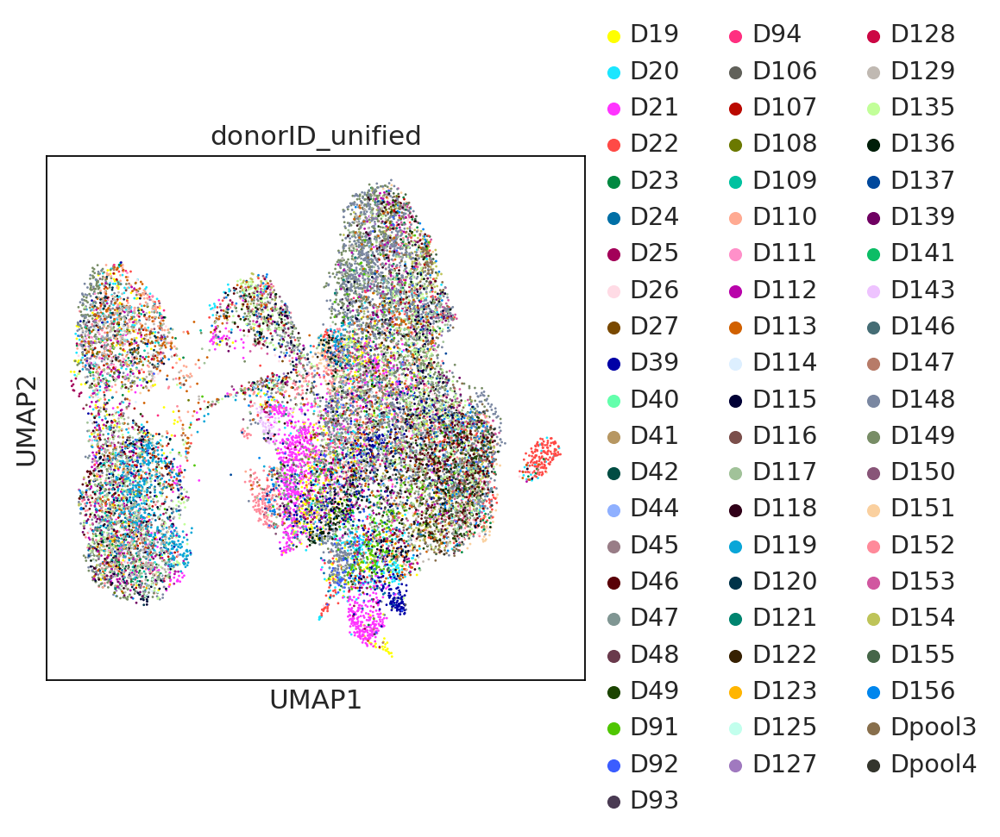

In [76]:
sc.pl.umap(adata,color='donorID_unified')

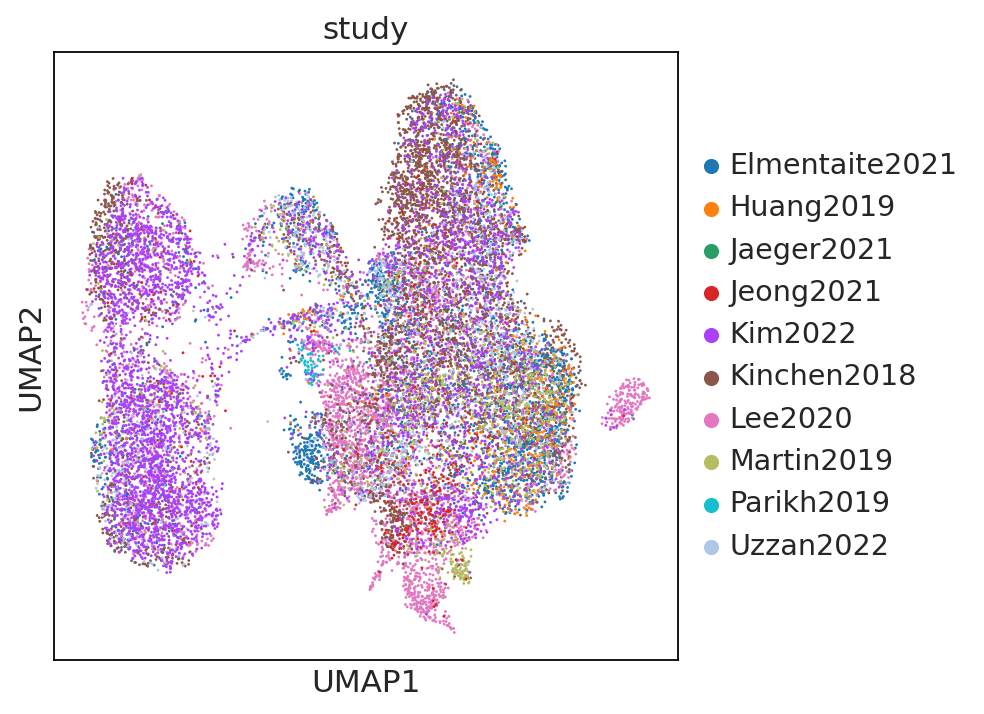

In [77]:
sc.pl.umap(adata,color='study')

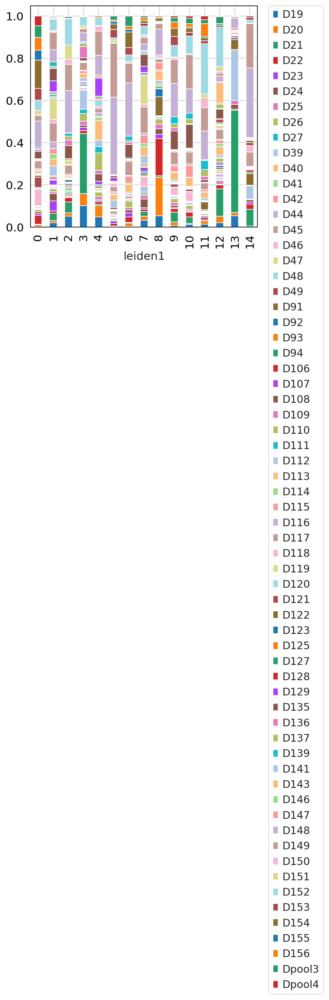

In [78]:
tmp = pd.crosstab(adata.obs['leiden1'], adata.obs['donorID_unified'],normalize='index'
                                                                         )
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

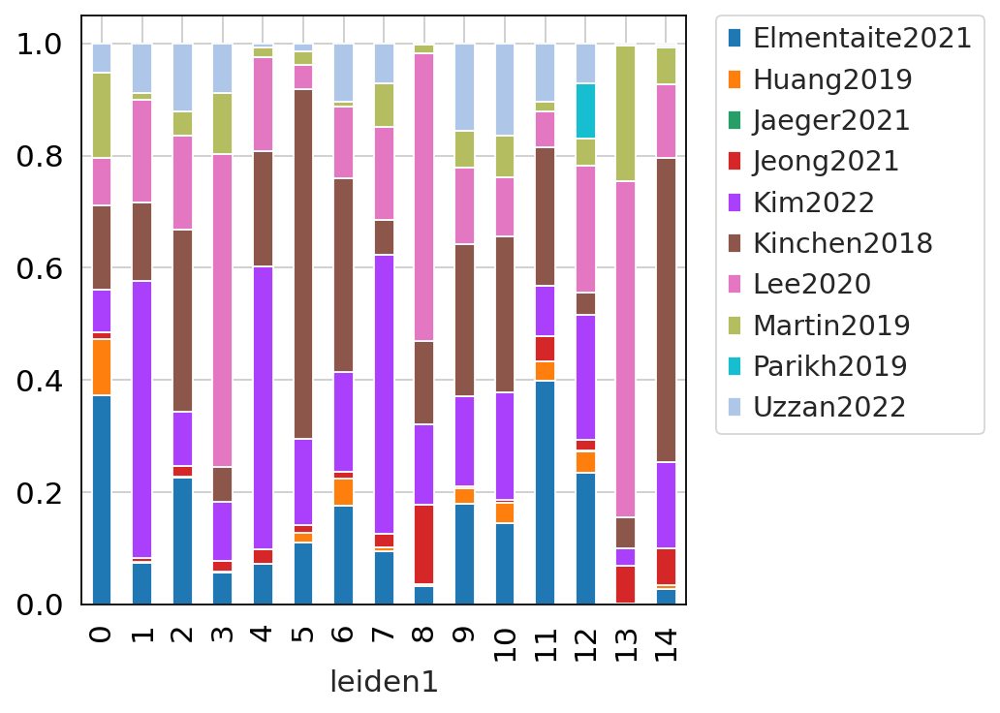

In [79]:
tmp = pd.crosstab(adata.obs['leiden1'], adata.obs['study'],normalize='index'
                                                                         )
tmp.plot.bar(stacked=True).legend(bbox_to_anchor=(1.05, 1), loc='upper left', borderaxespad=0.)

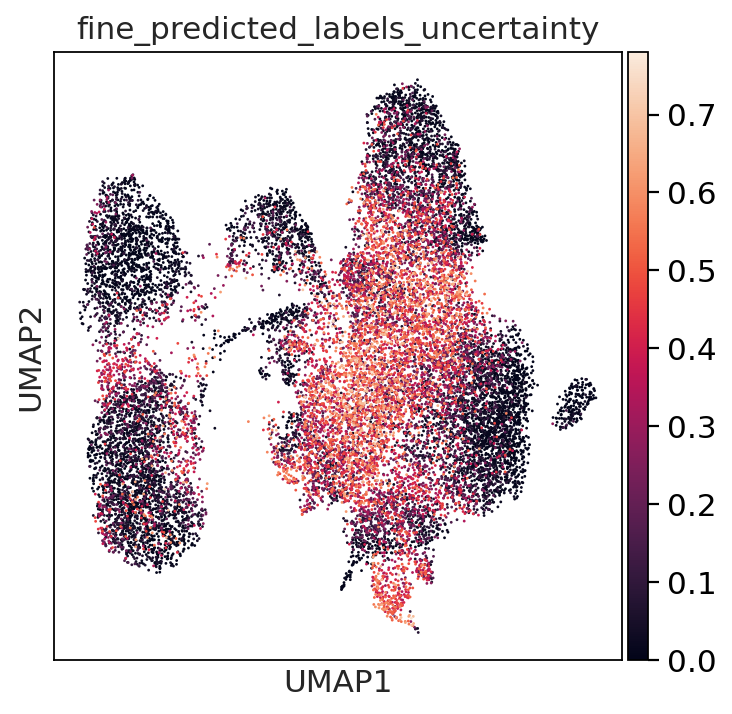

In [80]:
sc.pl.umap(adata,color='fine_predicted_labels_uncertainty')

In [81]:
pd.crosstab(adata.obs.leiden1,adata.obs.disease)

disease,crohns_disease,ulcerative_colitis,pediatric_IBD,cancer_colorectal,cancer_gastric
leiden1,,,,,
0,406,543,1266,226,236
1,20,421,141,339,921
2,74,770,394,289,200
3,185,256,100,949,210
4,29,349,118,270,861
5,36,939,189,63,245
6,14,644,321,182,275
7,100,169,129,211,665
8,16,165,39,563,314


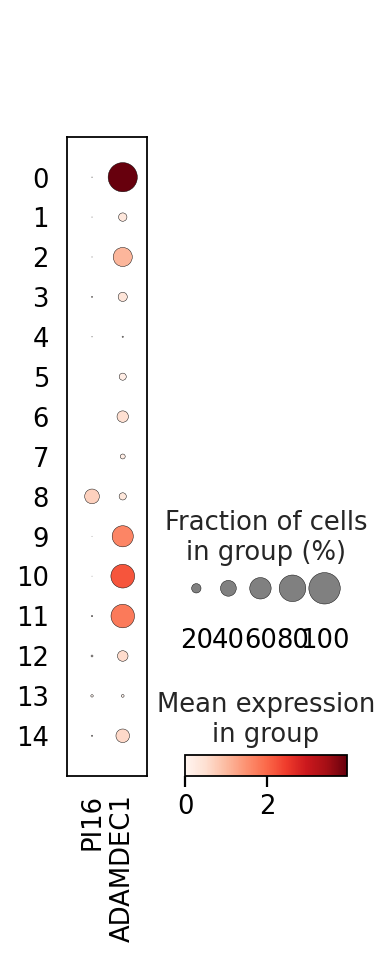

In [83]:
sc.pl.dotplot(adata,var_names=['PI16','ADAMDEC1'],groupby='leiden1')

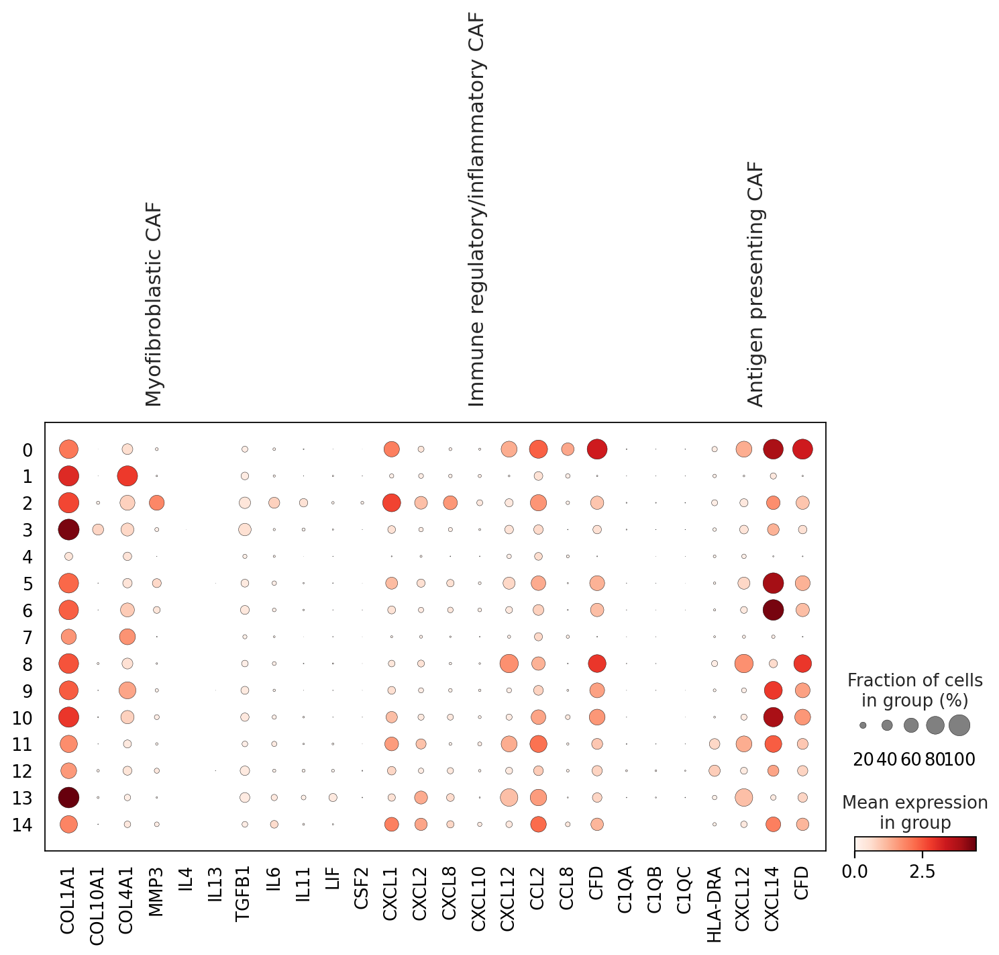

In [89]:
#CAF marker genes: https://pubmed.ncbi.nlm.nih.gov/35883004/#&gid=article-figures&pid=figure-3-uid-2
CAF_markers = {'Myofibroblastic CAF':['COL1A1','COL10A1','COL4A1','MMP3','IL4','IL13','TGFB1'],
              'Immune regulatory/inflammatory CAF':['IL6','IL11','LIF','CSF2','CXCL1',
                                                    'CXCL2','CXCL8','CXCL10','CXCL12','CCL2',
                                                    'CCL8','CFD','C1QA','C1QB','C1QC'],
               'Antigen presenting CAF':['HLA-DRA','CXCL12','CXCL14','CFD'],
              }

sc.pl.dotplot(adata,var_names=CAF_markers,groupby='leiden1')

In [85]:
pd.crosstab(adata.obs.fine_predicted_labels_uncertflagged,adata.obs.leiden1)

leiden1,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14
fine_predicted_labels_uncertflagged,,,,,,,,,,,,,,,
Crypt_fibroblast_PI16,89,3,127,364,0,86,198,5,975,1,190,77,41,208,27
Doublets,2,78,21,48,38,2,5,3,2,37,0,5,444,3,4
Fibroblast_reticular,0,0,0,0,0,0,0,0,0,0,0,249,0,0,0
Follicular_DC,0,0,2,0,0,0,0,0,0,0,0,0,20,0,0
Immune_recruiting_pericyte,0,3,0,0,0,0,0,35,0,1,0,0,0,0,0
Lamina_propria_fibroblast_ADAMDEC1,2541,1,282,122,0,9,6,1,75,56,423,372,18,165,184
Mesothelium,0,0,0,0,0,0,0,0,0,0,0,0,0,5,0
Myofibroblast,2,0,0,24,0,0,0,0,0,703,0,0,0,0,0
Oesophagus_fibroblast,3,0,4,0,0,0,2,0,0,0,8,0,0,0,0


In [90]:
unknown['fine_predicted_labels_resolved'] = (unknown['leiden1']
        .map(lambda x:{'0':'Lamina_propria_fibroblast_ADAMDEC1',
                       '1':'Pericyte',
                       '2':'Oral_mucosa_fibroblast',
                       '3':'Oral_mucosa_fibroblast', 
                       '4':'Vascular_smooth_muscle',
                       '5':'Villus_fibroblast_F3', 
                       '6':'Villus_fibroblast_F3',
                       '7':'Pericyte',
                       '8':'Crypt_fibroblast_PI16', 
                       '9':'Myofibroblast',
                       '10':'Lamina_propria_fibroblast_ADAMDEC1',
                       '11':'Fibroblast_reticular', 
                       '12':'Doublets',
                        '13':'Crypt_fibroblast_PI16',
                        '14':'Lamina_propria_fibroblast_ADAMDEC1'
                         }.get(x,x)).astype('category'))

In [91]:
unknown

,leiden1,fine_predicted_labels_uncertflagged,fine_predicted_labels_resolved
index,,,
ACGCCGAAGAGCTGGT-4918STDY7273964,11,Unknown,Fibroblast_reticular
ATGCGATAGGTGATAT-4918STDY7273964,2,Unknown,Oral_mucosa_fibroblast
CCGTTCATCGGAAATA-4918STDY7273964,2,Unknown,Oral_mucosa_fibroblast
CTCTACGTCAGTTTGG-4918STDY7273964,1,Unknown,Pericyte
GAAACTCCATATGAGA-4918STDY7273964,11,Unknown,Fibroblast_reticular
...,...,...,...
ATCCACCGTTTGTGTG-GSM4546342,14,Unknown,Lamina_propria_fibroblast_ADAMDEC1
GCTCCTAGTCTTCAAG-GSM4546342,6,Unknown,Villus_fibroblast_F3
CACATAGCAATCTGCA-GSM4546346,5,Unknown,Villus_fibroblast_F3


In [92]:
adata

AnnData object with n_obs × n_vars = 18903 × 36601
    obs: 'latent_cell_probability', 'latent_RT_efficiency', 'cecilia22_predH', 'cecilia22_predH_prob', 'cecilia22_predH_uncertain', 'cecilia22_predL', 'cecilia22_predL_prob', 'cecilia22_predL_uncertain', 'elmentaite21_pred', 'elmentaite21_pred_prob', 'elmentaite21_pred_uncertain', 'suo22_pred', 'suo22_pred_prob', 'suo22_pred_uncertain', 'n_counts', 'log1p_n_counts', 'n_genes', 'log1p_n_genes', 'percent_mito', 'n_counts_mito', 'percent_ribo', 'n_counts_ribo', 'percent_hb', 'n_counts_hb', 'percent_top50', 'n_counts_raw', 'log1p_n_counts_raw', 'n_genes_raw', 'log1p_n_genes_raw', 'percent_mito_raw', 'n_counts_mito_raw', 'percent_ribo_raw', 'n_counts_ribo_raw', 'percent_hb_raw', 'n_counts_hb_raw', 'percent_top50_raw', 'n_counts_spliced', 'log1p_n_counts_spliced', 'n_genes_spliced', 'log1p_n_genes_spliced', 'percent_mito_spliced', 'n_counts_mito_spliced', 'percent_ribo_spliced', 'n_counts_ribo_spliced', 'percent_hb_spliced', 'n_counts_hb_spl

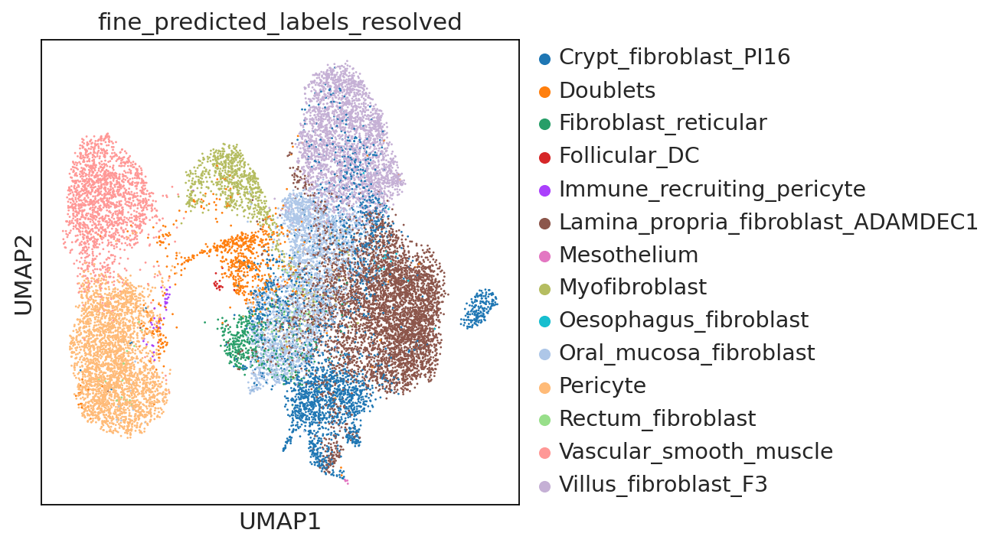

In [93]:
ON = {O:N for O,N in zip(unknown.index,unknown["fine_predicted_labels_resolved"])}
adata.obs["fine_predicted_labels_resolved"] = [ON[O] if O in ON else N for O,N in zip(adata.obs_names, adata.obs["fine_predicted_labels_uncertflagged"])]
sc.pl.umap(adata,color='fine_predicted_labels_resolved')

In [94]:
no_doublets = adata[~adata.obs.fine_predicted_labels_resolved.isin(['Doublets'])].copy()

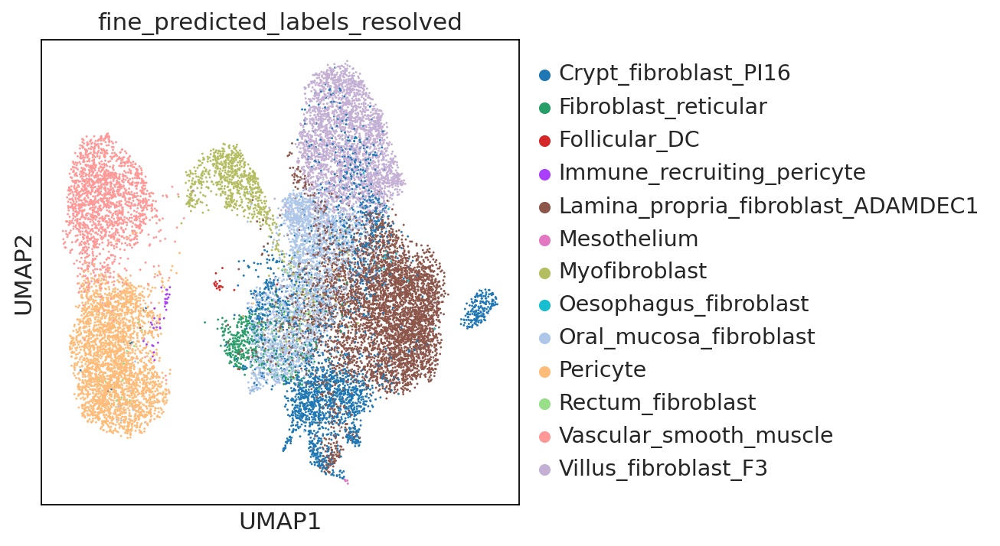

In [95]:
sc.pl.umap(no_doublets,color='fine_predicted_labels_resolved')

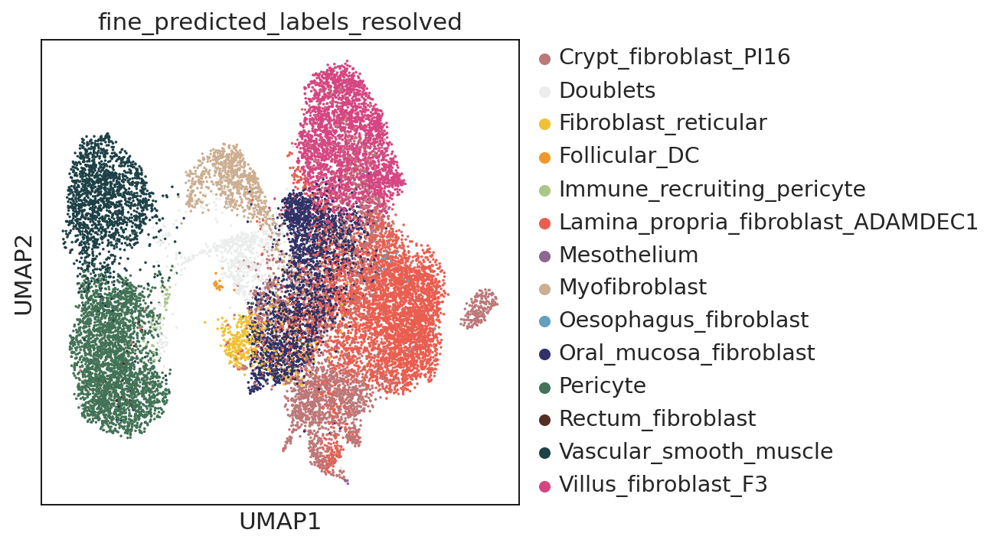

In [96]:
plt.rcParams['figure.figsize'] = [5,5]
sc.pl.umap(adata,color='fine_predicted_labels_resolved',palette = ['#bd7879',#'Crypt_fibroblast_PI16', 
                                                          '#ebeded',#doublets
           '#f0c134',#'Stromal_fibroblast_reticular',
                                                                        '#f0982c',#'Follicular_DC', 
                                                          
           '#AAC789',#'Immune_recruiting_pericyte',
           '#e95e50',#'Lamina_propria_fibroblast_ADAMDEC1', 
           '#8F6592',#'Mesothelium', 
           '#CCAE91',#'Myofibroblast',
           '#63A0C0',#'Oesophagus_fibroblast', 
           '#303267',#'Oral_mucosa_fibroblast', 
           '#437356',#'Pericyte',
           '#522e25',#'Rectum_fibroblast',
           #'#000000',#unknown
           '#1E4147',#'Vascular_smooth_muscle',
           '#d64582'#'Villus_fibroblast_F3'

    
                                              ],size=10)

In [97]:
annot = adata.obs[['fine_predicted_labels_uncertflagged','fine_predicted_labels_resolved']]

In [98]:
annot

,fine_predicted_labels_uncertflagged,fine_predicted_labels_resolved
index,,
AAAGCAACACCATCCT-4918STDY7273964,Lamina_propria_fibroblast_ADAMDEC1,Lamina_propria_fibroblast_ADAMDEC1
AAATGCCAGACCTAGG-4918STDY7273964,Vascular_smooth_muscle,Vascular_smooth_muscle
AAATGCCGTCTAGAGG-4918STDY7273964,Oral_mucosa_fibroblast,Oral_mucosa_fibroblast
AACCATGGTGGTCTCG-4918STDY7273964,Vascular_smooth_muscle,Vascular_smooth_muscle
AACCGCGGTGATAAGT-4918STDY7273964,Lamina_propria_fibroblast_ADAMDEC1,Lamina_propria_fibroblast_ADAMDEC1
...,...,...
TTTCCTCGTTACCAGT-GSM4546346,Doublets,Doublets
TTTGCGCCACAACGCC-GSM4546346,Villus_fibroblast_F3,Villus_fibroblast_F3
TTTGCGCGTCTCATCC-GSM4546346,Pericyte,Pericyte


In [101]:
#export final annotations
annot.to_csv('/nfs/team205/ao15/Megagut/Annotations_v3/disease_annot/resolved_annot/Mes_disease_annot.csv')